In [53]:
import pandas as pd
import numpy as np
from scipy.io import arff
import os
import pickle
import matplotlib.pyplot as plt

## Load dataset

In [54]:
uncertainty_level = '0_1' # '0_1'
dataset = 'ECG200'

dataset_path = os.path.join('uncertain_datasets', uncertainty_level, dataset)

In [55]:
data_test        = pd.DataFrame(arff.loadarff(os.path.join(dataset_path, dataset + '_TEST.arff'))[0]).astype({'target': float})
data_noise_test  = pd.DataFrame(arff.loadarff(os.path.join(dataset_path, dataset + '_NOISE_TEST.arff'))[0])
data_train       = pd.DataFrame(arff.loadarff(os.path.join(dataset_path, dataset + '_TRAIN.arff'))[0]).astype({'target': float})
data_noise_train = pd.DataFrame(arff.loadarff(os.path.join(dataset_path, dataset + '_NOISE_TRAIN.arff'))[0])

df = pd.concat([data_test, data_train], ignore_index=True)
df_noise = pd.concat([data_noise_test, data_noise_train], ignore_index=True)

timeseries = df.drop('target', axis=1).to_numpy()
deltas = df_noise.to_numpy()
labels = df['target'].to_numpy(dtype=int)

print("timeseries:")
print(timeseries.shape)
print("deltas:")
print(deltas.shape)
print("labels:")
print(labels.shape)

timeseries:
(200, 96)
deltas:
(200, 96)
labels:
(200,)


## Load results

In [67]:
results_path = os.path.join('results', '30_11', 'results_' + dataset + '_' + uncertainty_level + '.dat')

similarity_measure = 'ED'
lenSubsequence = 24

In [68]:
with open(results_path, 'rb') as f:
    results = pickle.load(f)
    
clusters = results[similarity_measure][lenSubsequence]['clusters']
uShapelets = results[similarity_measure][lenSubsequence]['uShapelets']

## Timeseries clusters

Cluster: 1
Remaining: (200,)
In this cluster (42,)


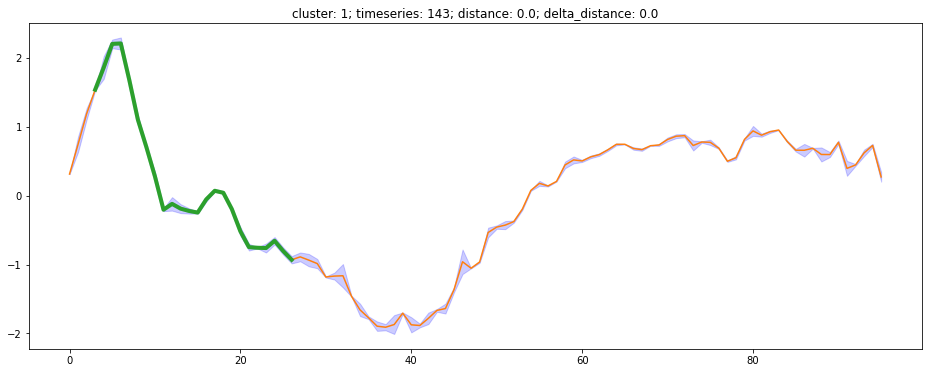

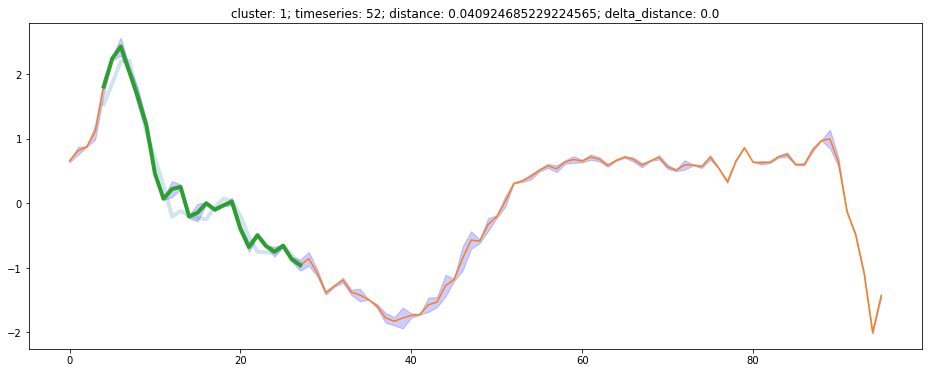

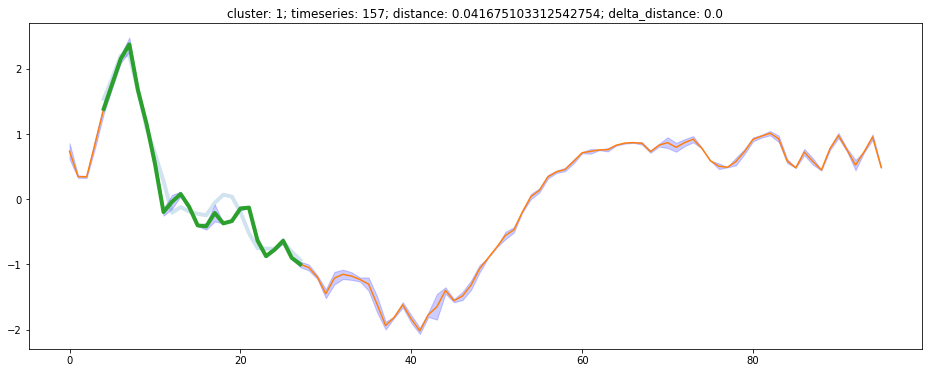

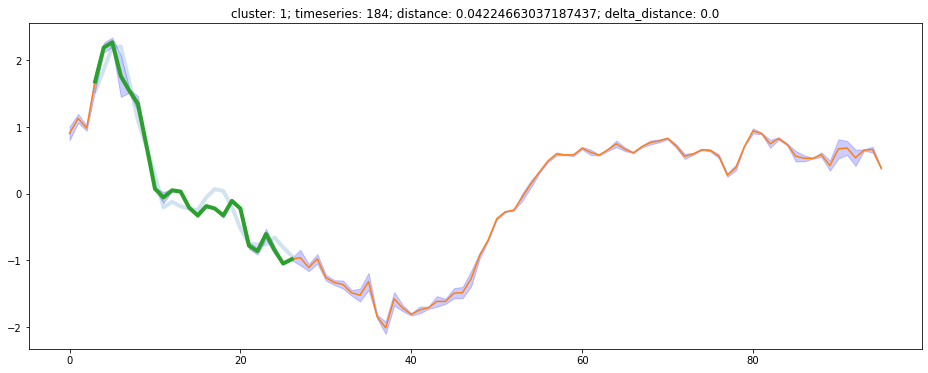

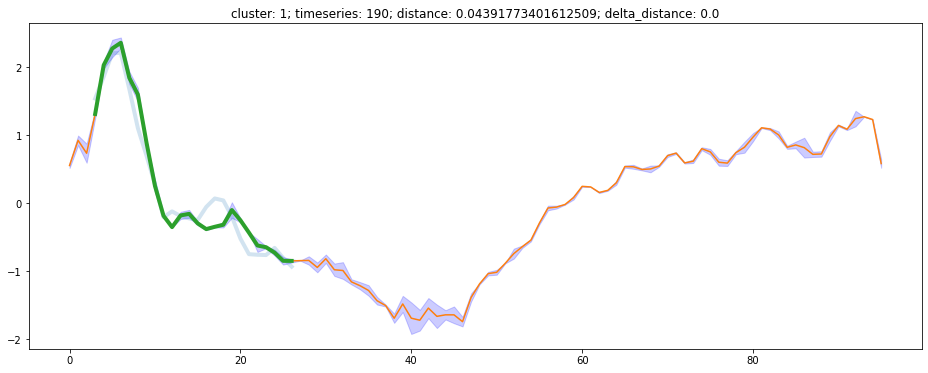

...

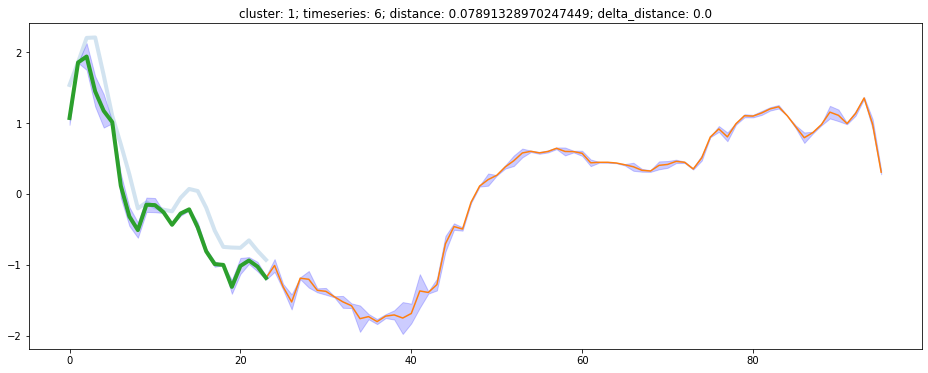

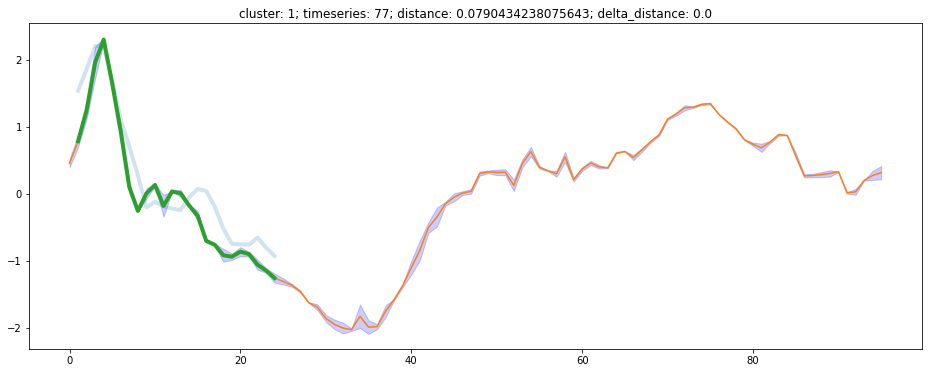

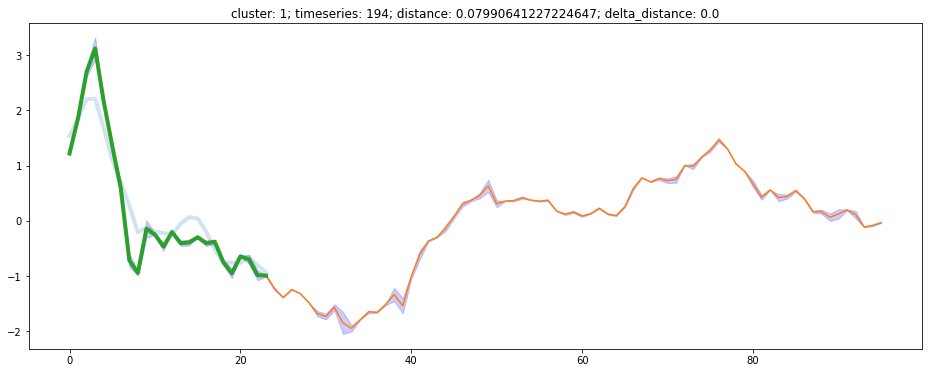

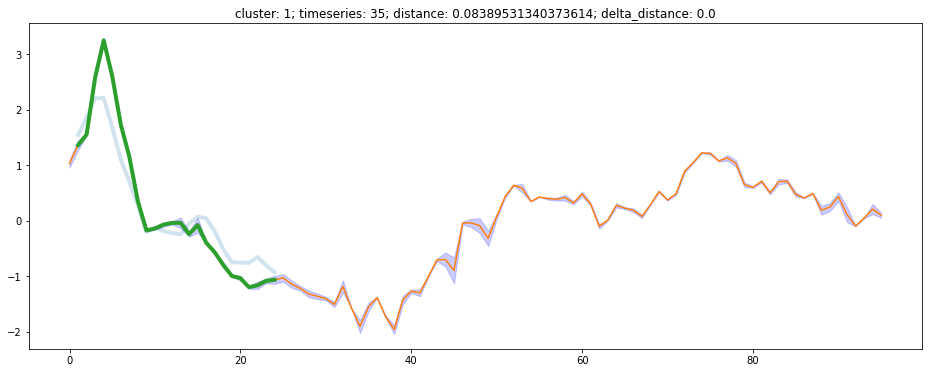

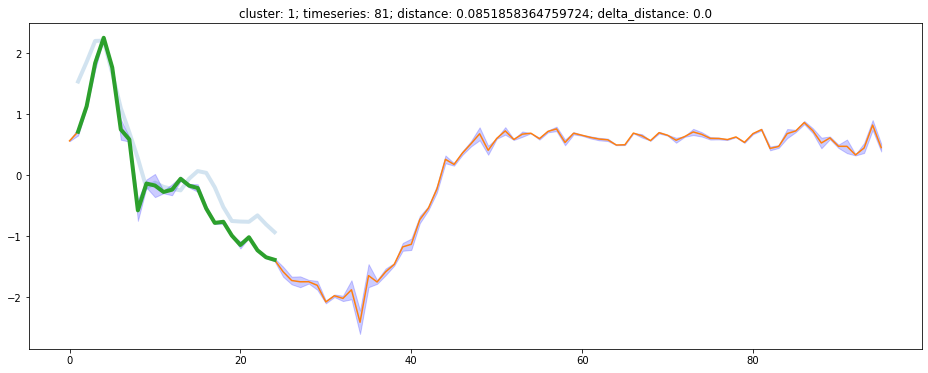

Cluster: 2
Remaining: (158,)
In this cluster (131,)


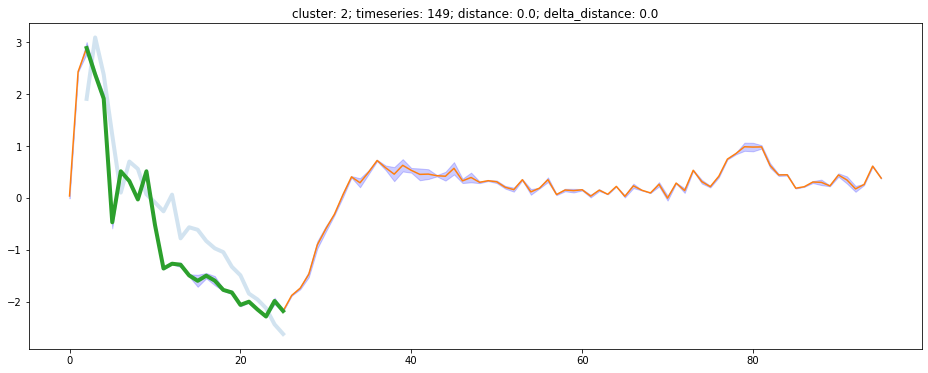

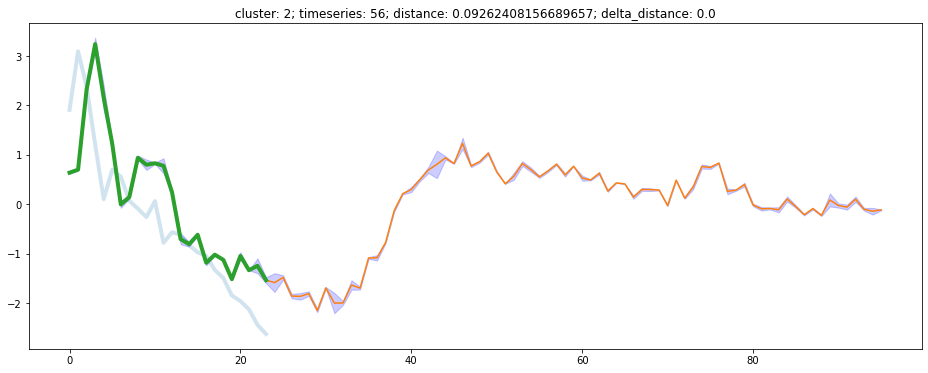

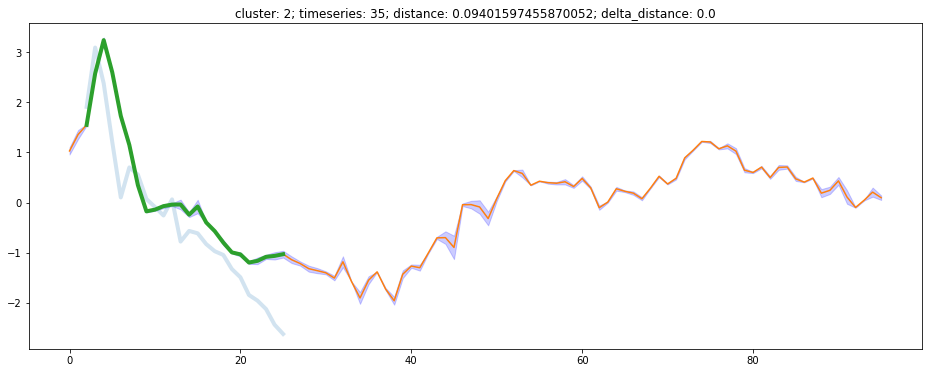

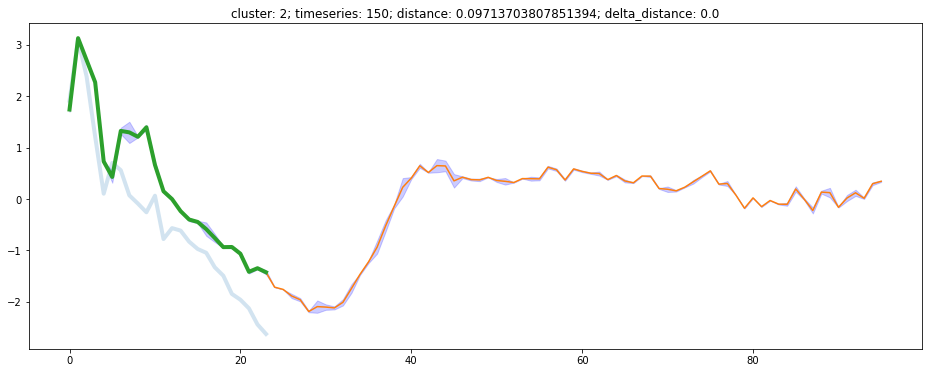

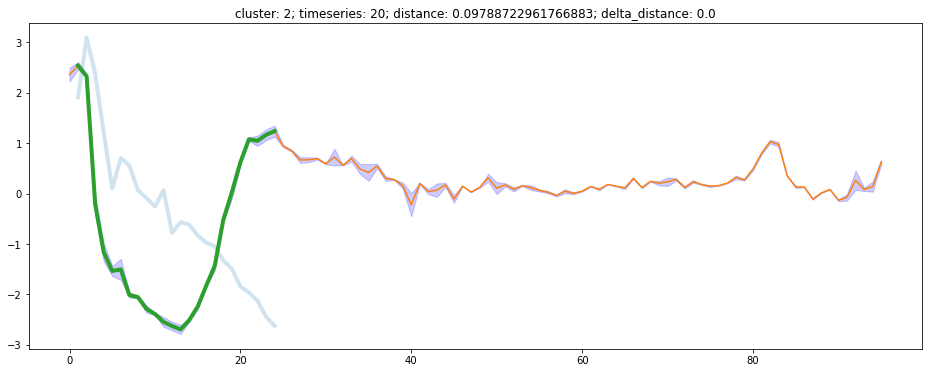

...

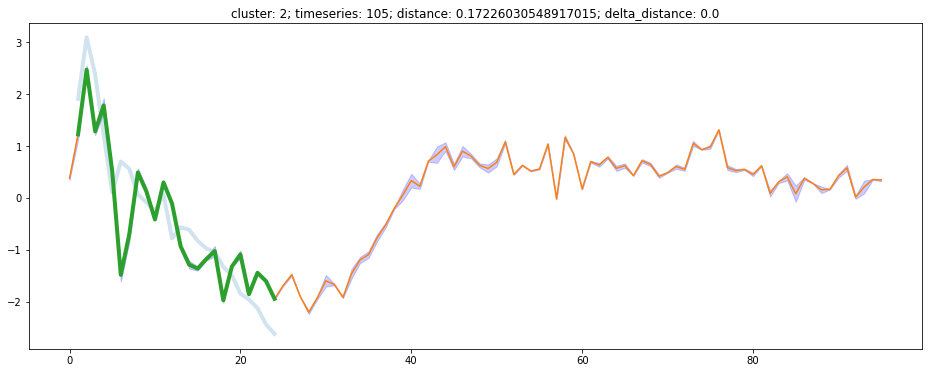

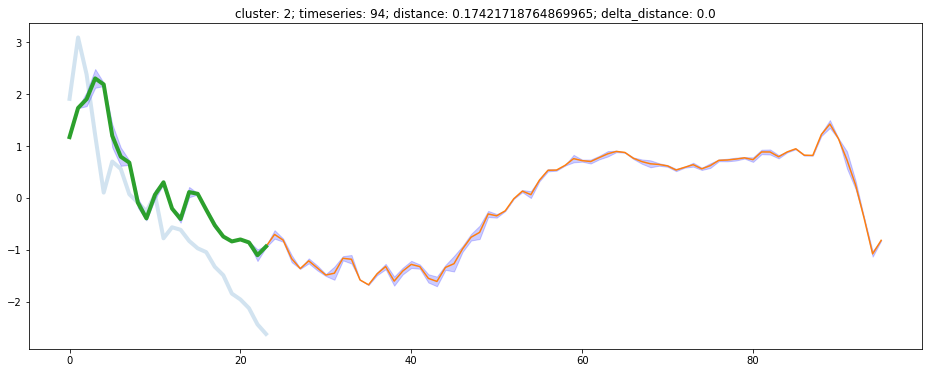

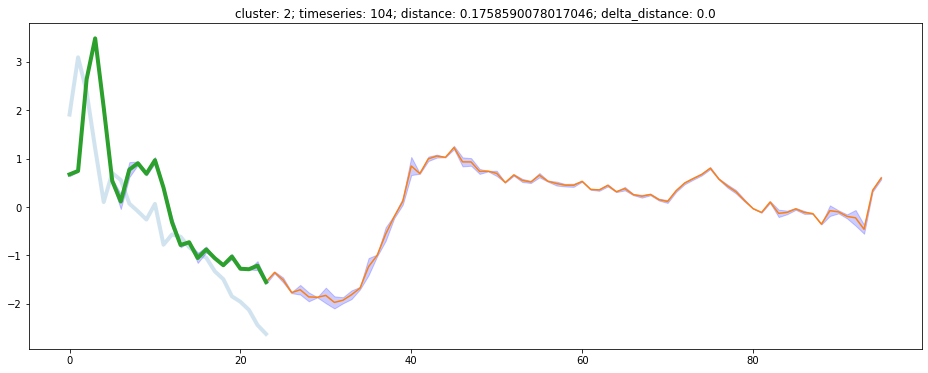

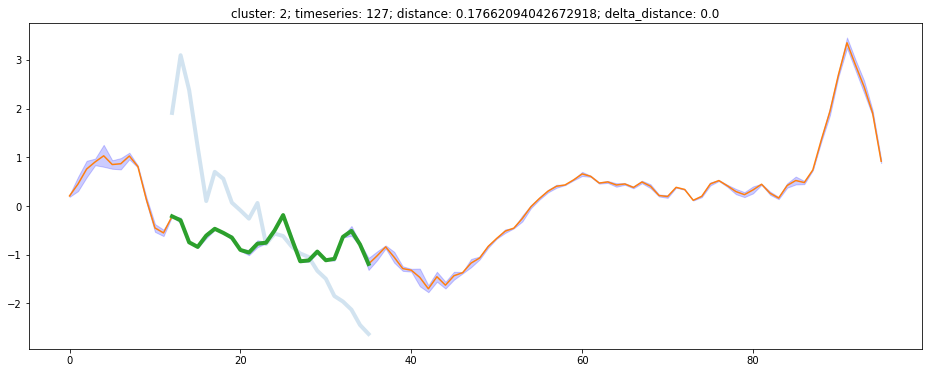

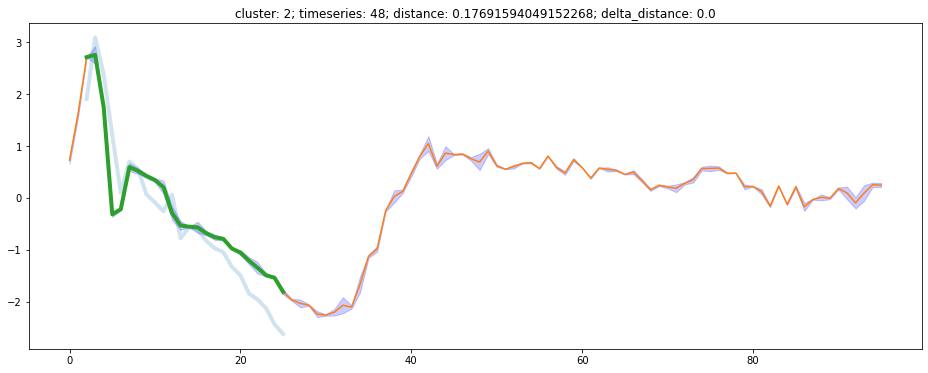

Cluster: 3
Remaining: (27,)
In this cluster (22,)


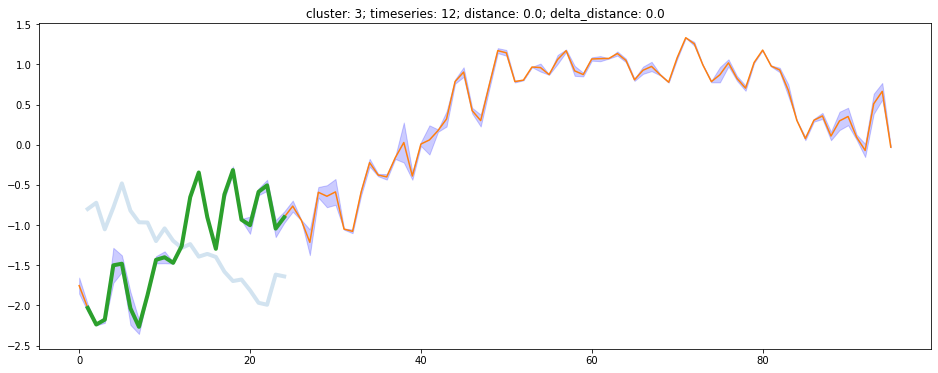

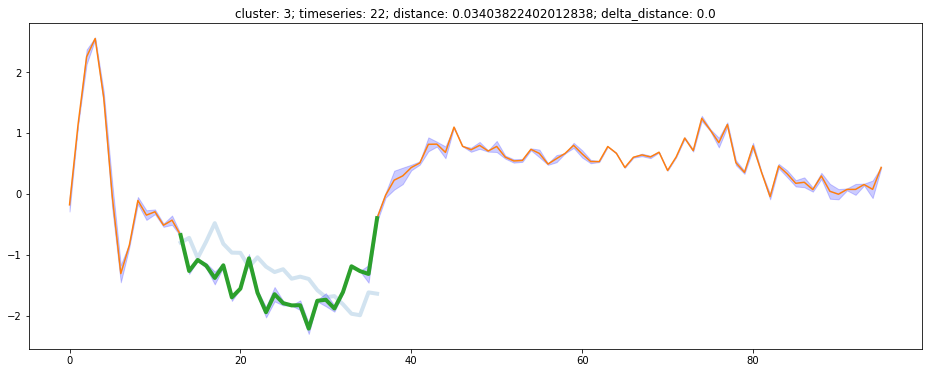

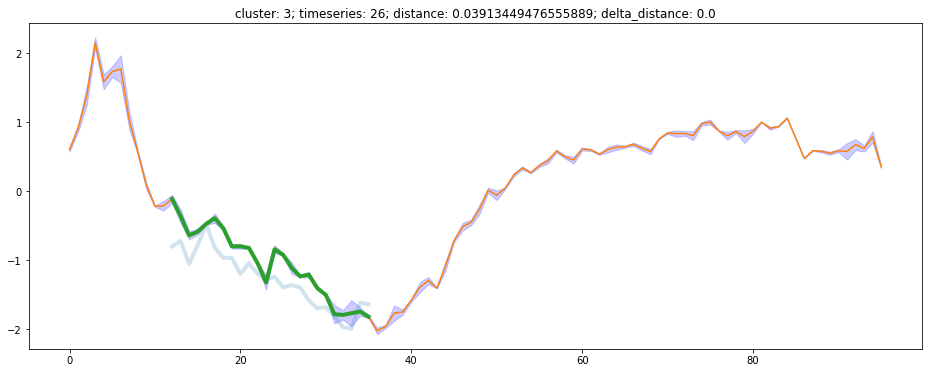

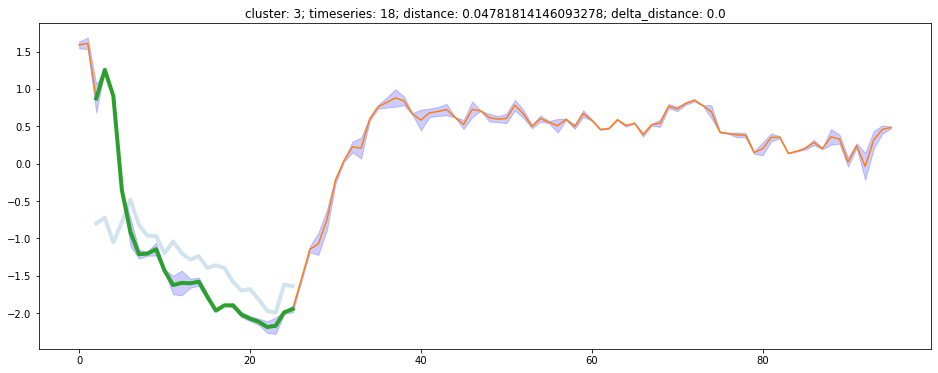

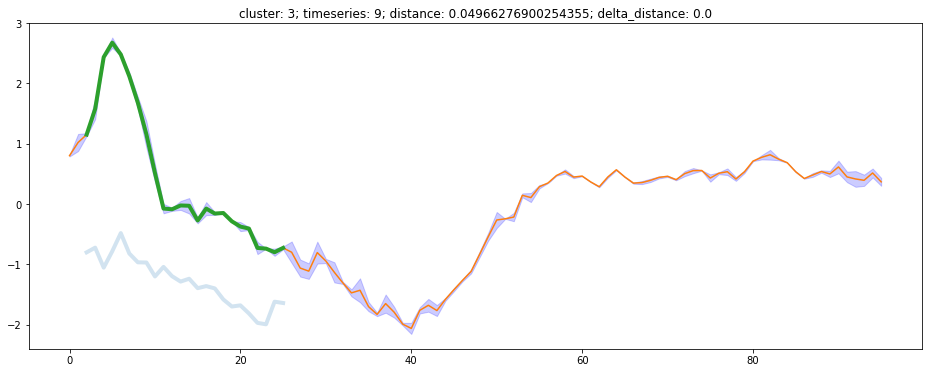

...

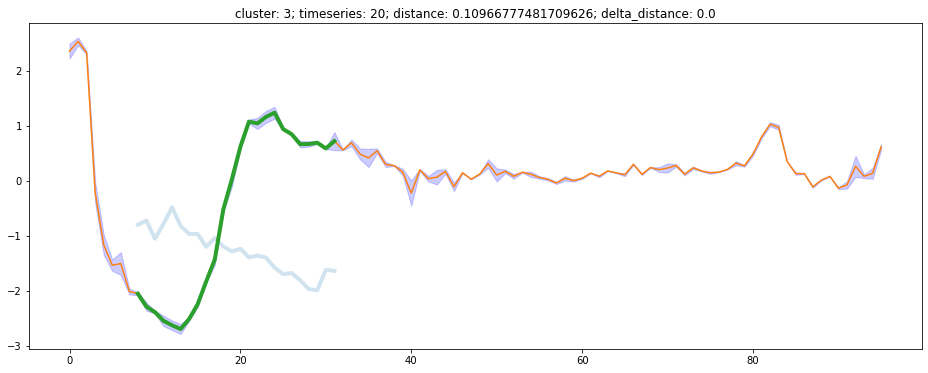

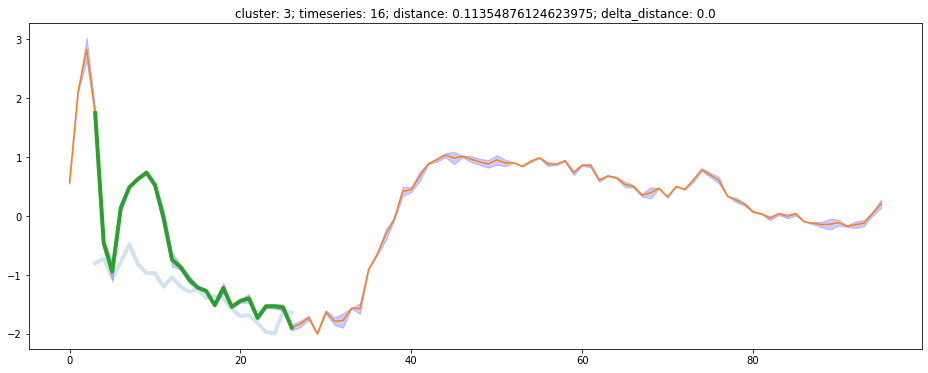

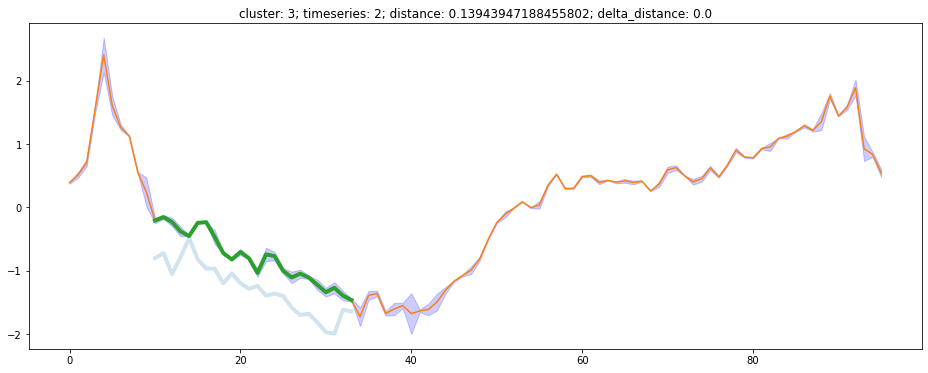

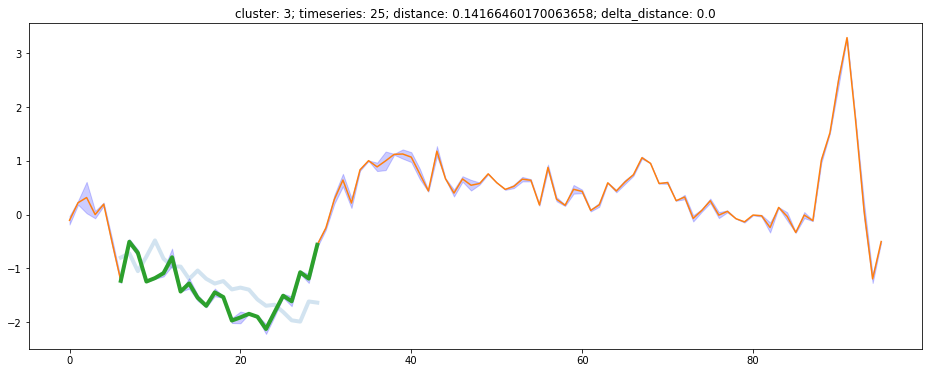

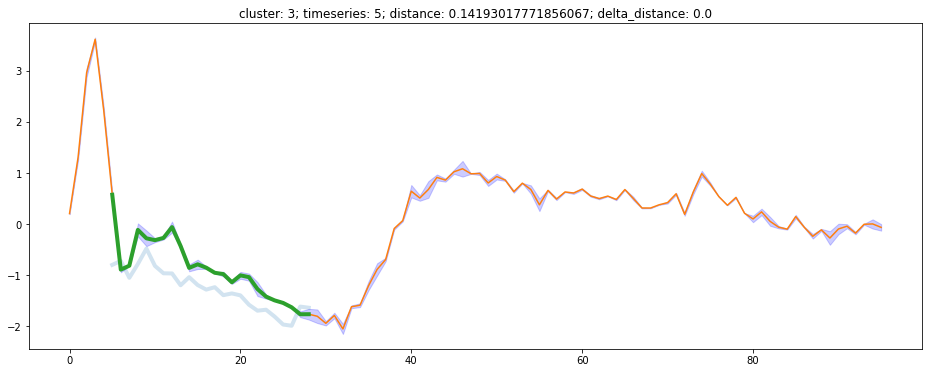

In [73]:
remaining_clusters = clusters
for uShapelet in uShapelets:
    ts_index = uShapelet['ts_index']
    loc = uShapelet['loc']
    cluster = clusters[ts_index]
    
    # shapelet = timeseries[ts_index, loc : loc + lenSubsequence]
    # deltas_shapelet = deltas[ts_index, loc : loc + lenSubsequence]
    
    distances = uShapelet['distances']
    delta_distances = uShapelet['delta_distances']
    locations = uShapelet['locations']
    
    indices_cluster = np.argwhere(remaining_clusters == cluster).reshape(-1)
    
    print('Cluster:', cluster)
    print('Remaining:', remaining_clusters.shape)
    print('In this cluster', indices_cluster.shape)
    
    sorted_indices_cluster = indices_cluster[np.lexsort((delta_distances[indices_cluster], distances[indices_cluster]))]
    orderline_cluster = distances[sorted_indices_cluster]
    delta_orderline_cluster = delta_distances[sorted_indices_cluster]
    orderline_locations_cluster = locations[sorted_indices_cluster]
    
    for curIndex, curDistance, curDelta_distance, curLocation in \
    zip(sorted_indices_cluster, orderline_cluster, delta_orderline_cluster, orderline_locations_cluster):
        if cluster != remaining_clusters[curIndex]:
            print('ERROR')
            print('cluster:', cluster)
            print('remaining_clusters[curIndex]:', remaining_clusters[curIndex])
            break
        plt.figure(figsize=(16, 6))
        plt.title(f'cluster: {remaining_clusters[curIndex]}; timeseries: {curIndex}; distance: {curDistance}; delta_distance: {curDelta_distance}')
        plt.plot(range(curLocation, curLocation + lenSubsequence), timeseries[ts_index, range(loc, loc + lenSubsequence)], linewidth=4, alpha=0.2)
        plt.plot(timeseries[curIndex])
        plt.plot(range(curLocation, curLocation + lenSubsequence), timeseries[curIndex, range(curLocation, curLocation + lenSubsequence)], linewidth=4)
        plt.fill_between(range(len(timeseries[curIndex])), timeseries[curIndex] - deltas[curIndex], timeseries[curIndex] + deltas[curIndex], color='b', alpha=0.2)
        plt.show()
        
    remaining_clusters = np.delete(remaining_clusters, indices_cluster, axis=0)

In [41]:
indices = np.lexsort((delta_distances, distances))
orderline = distances[indices]
delta_orderline = delta_distances[indices]
orderline_locations = locations[indices]

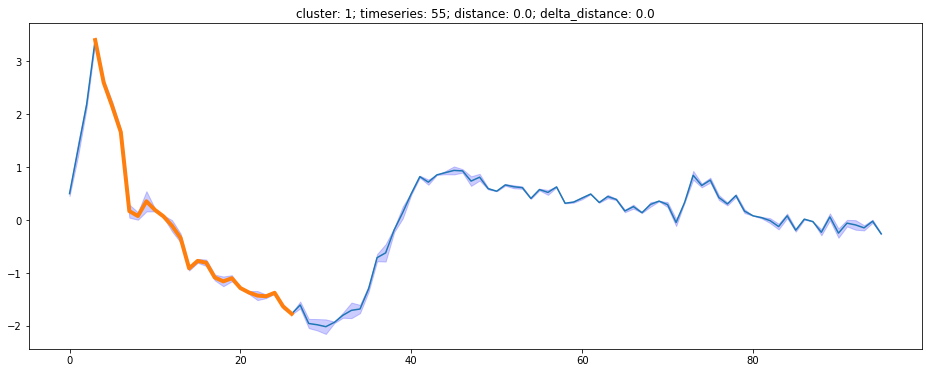

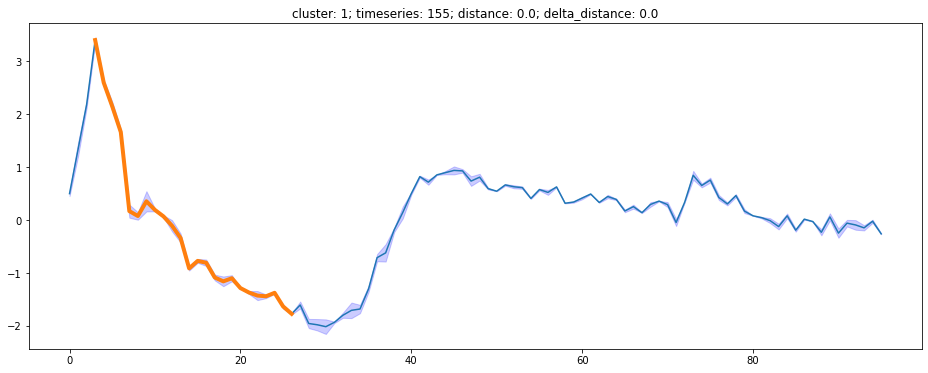

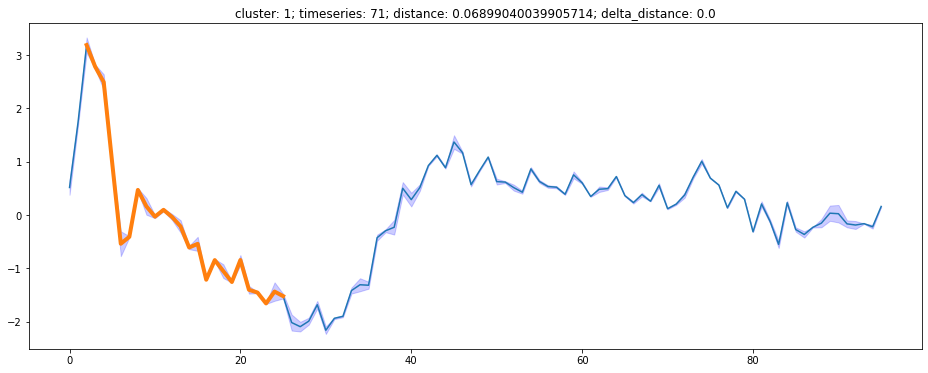

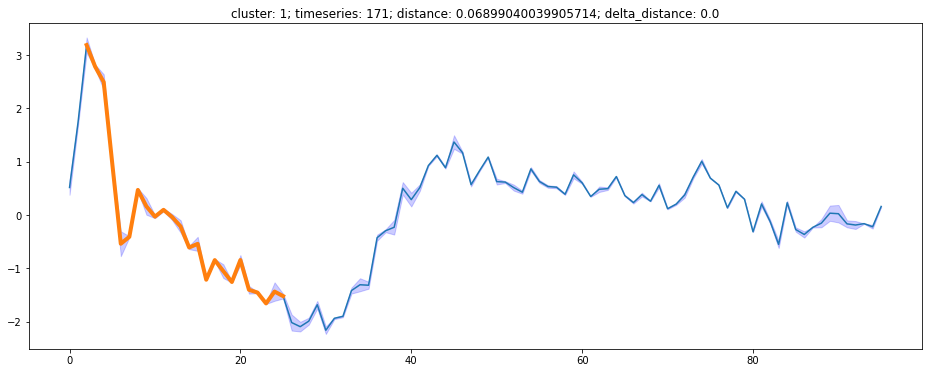

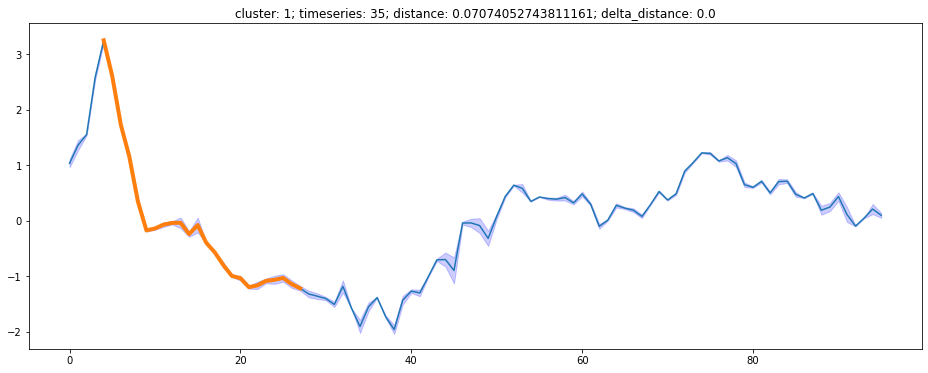

...

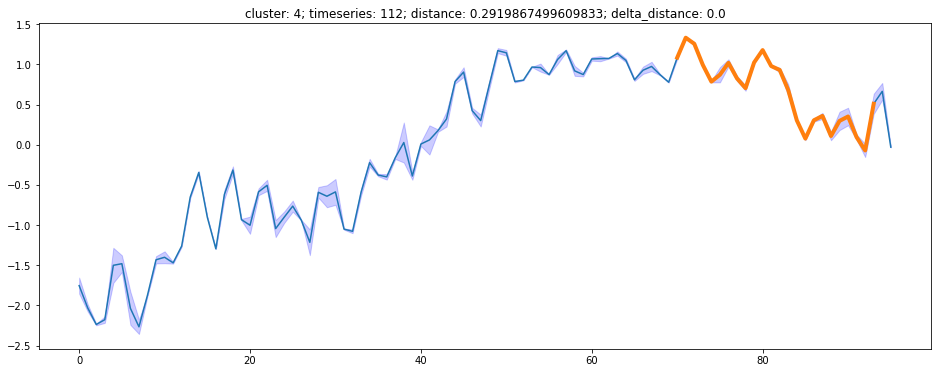

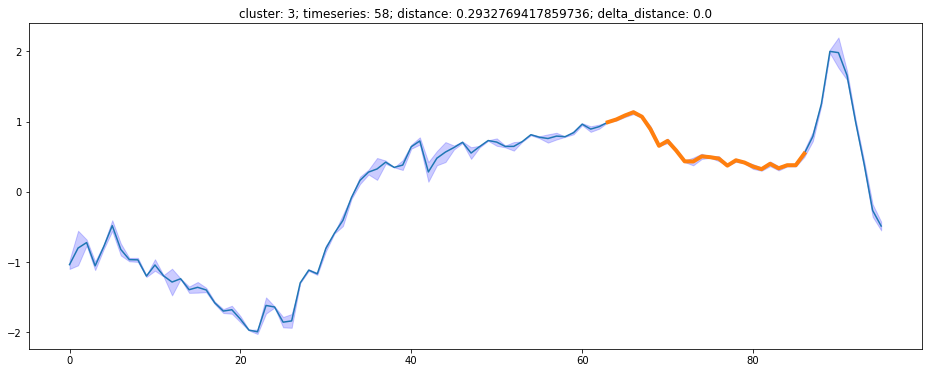

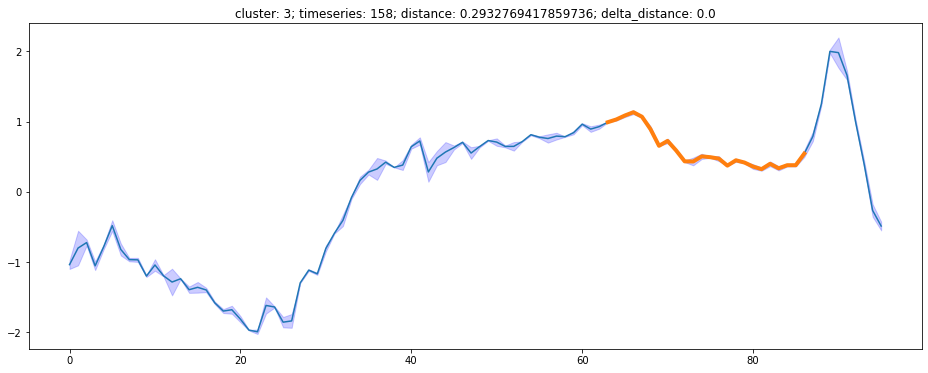

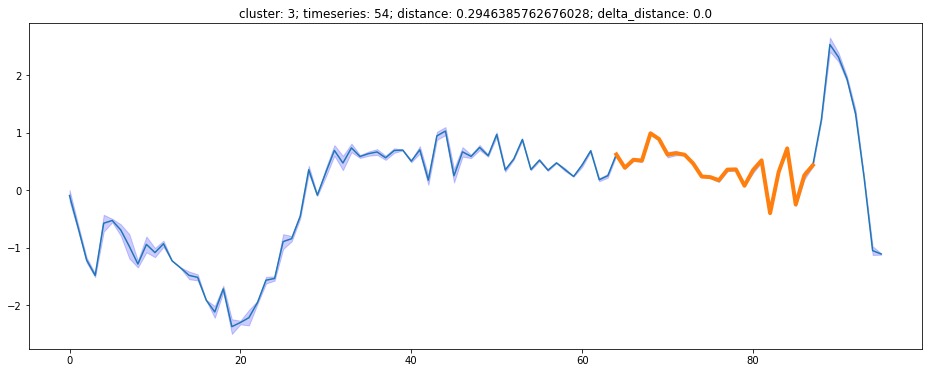

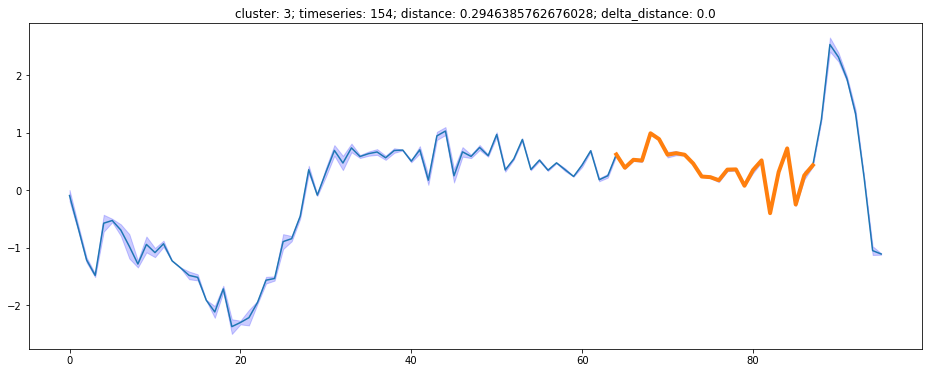

In [42]:
for curIndex, curDistance, curDelta_distance, curLocation in zip(indices, orderline, delta_orderline, orderline_locations):
    plt.figure(figsize=(16, 6))
    plt.title(f'cluster: {clusters[curIndex]}; timeseries: {curIndex}; distance: {curDistance}; delta_distance: {curDelta_distance}')
    plt.plot(timeseries[curIndex])
    plt.plot(range(curLocation, curLocation + lenSubsequence), timeseries[curIndex, range(curLocation, curLocation + lenSubsequence)], linewidth=4)
    plt.fill_between(range(len(timeseries[curIndex])), timeseries[curIndex] - deltas[curIndex], timeseries[curIndex] + deltas[curIndex], color='b', alpha=0.2)
    plt.show()